![](pgarde1.png)

# <span style="color:yellow">Introduction

***<span style="color:red">Twitter</span> est un réseau social populaire où les utilisateurs partagent des messages appelés tweets. Twitter nous permet d’exploiter les données de tout utilisateur utilisant l’API Twitter ou Tweepy. Les données seront des tweets extraits de l’utilisateur. La première chose à faire est d’obtenir la clé du consommateur, secret du consommateur, clé d’accès et secret d’accès de développeur Twitter facilement disponible pour chaque utilisateur. Ces clés aideront l’API pour l’authentification.***

<br>***donc dans ce mini projet on a comme des objectifs:***

#### ***Objectifs :***

* Maitriser l’API de twitter pour l’extraction des tweets
* Maitriser la partie NLP (natural language processing) avec NLTK en Python
* Appliquer les principes de nettoyage des données
* Classer les tweets : regrouper ensemble les tweets qui sont similaires. C’est une étape qui peut être considérée comme une étape


# <span style="color:yellow">5. Concatination des CSV en un combineTweets.csv

In [1]:
import os
import glob
import pandas as pd
os.chdir("C:/Users/PCS/Desktop/3DNIs_1/ProjetDataMiningTweet/tweetsCSV")
extention ='csv'
all_filenames=[i for i in glob.glob('*.{}'.format(extention))]

#combine all files in the list
combinedTweets= pd.concat([pd.read_csv(f) for f in all_filenames])
#export to csv

combinedTweets.to_csv("combinedTweets.csv", index=False, encoding='utf-8-sig')


Le script donné ci-dessus va générer un seul CSV file qui combine tous les tweets extracté dans les CSV files précédents je l'ai nommé <font color='red'> 
                               <center >*** combinedTweets ***</font> 
comme resultat j'ai généré environ de <font color='green'> 31342 tweets</font>.


# <span style="color:yellow">6. Prétraitement des tweets


### ***6.1. Extracting twitter data (tweepy + pandas)***
 

###  <center>  Importing our libraries


The requirements that we'll need to install are:

<font color='red'>NumPy:</font> This is the fundamental package for scientific computing with Python. Besides its obvious scientific uses, NumPy can also be used as an efficient multi-dimensional container of generic data.

<font color='red'>Pandas:</font> This is an open source library providing high-performance, easy-to-use data structures and data analysis tools.

<font color='red'>Tweepy:</font> This is an easy-to-use Python library for accessing the Twitter API.

<font color='red'>Matplotlib:</font> This is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

<font color='red'>Seaborn:</font> This is a Python visualization library based on matplotlib. It provides a high-level interface for drawing attractive statistical graphics.

<font color='red'>Textblob:</font> This is a Python library for processing textual data. It provides a simple API for diving into common natural language processing (NLP) tasks.

In [2]:
# General:
import tweepy           # To consume Twitter's API
import pandas as pd     # To handle data
import numpy as np      # For number computing
from glob import glob
import os
# For plotting and visualization:
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Explorer la dataset NewsTweets  `combinedTweets.csv` 


## 6.2. Exploration du dataset

#### <span style="color: #C71585"> Les objectifs de cette étape consisent à :
* Comprendre le jeu des données
* Soulever les problèmes à corriger dans les données
* Extraire les informations à partir des données

***

In [3]:
# Exporter combinedTweets.csv dans un data frame nomé NewsTweets
NewsTweets= pd.read_csv("C:/Users/PCS/Desktop/3DNIs_1/ProjetDataMiningTweet/combinedTweets.csv")

# Afficher NewsTweets
NewsTweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339,1337505915520561160,RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340,1337505914925019136,"Don't use social media less ,use it more inten..."


In [4]:
NewsTweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31342 entries, 0 to 31341
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   TweetId  31342 non-null  int64 
 1   Tweet    31342 non-null  object
dtypes: int64(1), object(1)
memory usage: 489.8+ KB


In [5]:
newCombinedTweets = NewsTweets.drop_duplicates() # Drop any duplicate data
newCombinedTweets.to_csv('newCombinedTweets.csv')


In [6]:
newCombinedTweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339,1337505915520561160,RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340,1337505914925019136,"Don't use social media less ,use it more inten..."


## 6.3. Data Cleaning

#### <span style="color: #C71585"> Tâches de la préparation des données </span>
* Nettoyage des données : Identifier et corriger les erreurs, les valeurs manquantes et le format des données.
* Selection d'attributs : Identtifier les attributs (features ) les plus pertinents pour la tâche.
* Transformations des données : Modifier l'échelle ou la distribution des variables.
* Feature Engineering : Dérivation de nouveaux attributs à partir des attributs disponibles.
* Réduction de dimension : Créer des projections compactes des données pour les compresser.

***
### 6.3.1. cleaning colonne de Tweet


Les tweets contiennent des objets inutiles tels que des hashtags, des mentions, des liens et des signes de ponctuation qui peuvent affecter les performances d'un algorithme et doivent donc être supprimés.
Tous les textes sont convertis en minuscules pour éviter que les algorithmes n'interprètent les mêmes mots avec des cas différents comme étant différents.

In [7]:
tweets =newCombinedTweets.drop_duplicates()

print(tweets)

                   TweetId                                              Tweet
0      1337514187698958345  @EricRWeinstein so you too use identity politc...
1      1337513742867836935  i can only imagine james’ understanding of chi...
2      1337512998253056000  RT @MackayIM: "found that the vaccine generate...
3      1337512774902157315   @chopsueyside Do they have politcs in australia?
4      1337509066038530054  @WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...                    ...                                                ...
31337  1337505918041337858  Metrics for B2B Website, Social Media, and Ema...
31338  1337505915696713733  @hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...
31339  1337505915520561160  RT @donwinslow: WE DEMOCRATS MUST WIN GEORGIA....
31340  1337505914925019136  Don't use social media less ,use it more inten...
31341  1337505913956163590  RT @manifestive: Hope you take care of yoursel...

[31158 rows x 2 columns]


In [8]:
tweets = tweets.loc[tweets['Tweet'].replace('(www\.\w+\.com)/(\w+)',r'\1',regex=True).drop_duplicates().index]
tweets.columns=['TweetId', 'Tweet']
tweets

,TweetId,Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate..."
3,1337512774902157315,@chopsueyside Do they have politcs in australia?
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...
...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema..."
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...


In [9]:
tweets['Processing_Tweet']=tweets['Tweet'].str.replace(r'[^\w\d\s]',' ')
tweets

,TweetId,Tweet,Processing_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein so you too use identity politc...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chi...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",RT MackayIM found that the vaccine generate...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablo_honey1 rea...
...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private companie...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many reaso...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Ema...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyon...


In [10]:
#remove punctuation, unwanted words

#####################################################

#replace urls with le vide
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'^http\://[a-zA-Z0-9\-\.]+\.[a-zA-Z]{2,3}(/\S*)?$', ' ') #removing any email or hyper link url

tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'gt', ' ')
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'boo', ' ')

#replace https with le vide
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'https', ' ') 

#replace co with le vide
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'co', ' ') #Removing https

 #Removing RT
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'RT', ' ') 

#Removing https
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'so', ' ') 


#replace whitespaces between terms with a single space
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'\s+', ' ')


#eliminer whiteSpaces
tweets['Processing_Tweet']=tweets['Processing_Tweet'].str.replace(r'^\s+|\s+?$', '')

tweets



,TweetId,Tweet,Processing_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablo_honey1 realDon...
...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private mpanies sho...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [11]:
#ajouter un nouveau colonne nommé cleaning_Tweet

######################################################


tweets['cleaning_Tweet']=tweets['Processing_Tweet']
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein you too use identity politcs as...,EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chin...,i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that the vaccine generated anti...,MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablo_honey1 realDon...,WFEMahoney JustAManic2020 pablo_honey1 realDon...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mr_mavericck scrowder True Private mpanies sho...,mr_mavericck scrowder True Private mpanies sho...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many rea ns ...,Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Email...,Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***

## 5.4. Data CleaningIntroduction to NLP: Natural Language Processing and NLTK

![](stopwords.png)

***
## <span style="color: #b25111">pre-processing  </span> 

***j'ai traité une des méthodes permettant de supprimer la ponctuation d’une chaîne de caractères en Python. Il s’agit d’une étape particulièrement utile pour le prétraitement et le nettoyage des tweets***
<br> ***je l'ai appliqué dans les deux colonnes Processing_Tweet et cleaning_Tweet***

In [12]:
import string
string.punctuation
def remove_punctuation(txt):
    txt_nopunct= "".join([c for c in txt if c.lower() not in string.punctuation])
    return txt_nopunct

In [13]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_punctuation(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein you too use identity politcs as...,EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chin...,i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that the vaccine generated anti...,MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablohoney1 realDona...,WFEMahoney JustAManic2020 pablo_honey1 realDon...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mrmavericck scrowder True Private mpanies shou...,mr_mavericck scrowder True Private mpanies sho...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many rea ns ...,Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Email...,Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [14]:
import string
string.punctuation
def remove_punctuation(txt):
    txt_nopunct= "".join([c for c in txt if c not in string.punctuation])
    return txt_nopunct

In [15]:
tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].apply(lambda x: remove_punctuation(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,EricRWeinstein you too use identity politcs as...,EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,i can only imagine james understanding of chin...,i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...",MackayIM found that the vaccine generated anti...,MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,chopsueyside Do they have politcs in australia,chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,WFEMahoney JustAManic2020 pablohoney1 realDona...,WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,mrmavericck scrowder True Private mpanies shou...,mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,Lepplady tralalalumbum One of the many rea ns ...,Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...",Metrics for B2B Website Social Media and Email...,Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...,hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> word_tokenize  </span>

***j'ai appliqué la méthode de Tokenization pour séparer les tweets dans la colonne Processing_Tweet en des tokens (mots séparés)***

In [16]:
import re
def tokenize(txt):
    tokens = re.split('\W+', txt.lower())
    return tokens

In [17]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: tokenize(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, you, too, use, identity, poli...",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[i, can, only, imagine, james, understanding, ...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, that, the, vaccine, generate...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, do, they, have, politcs, in, au...",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, mpanies...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, one, of, the, many, ...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, for, b2b, website, social, media, an...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Stopwords  </span> 


Les <font color="red">Stop Words </font> sont des mots couramment utilisés dont la présence dans une phrase a moins de poids que d'autres mots. Ils comprennent des mots comme «et», «ou», «a» et.c.
La tokenisation est le processus de division d'une chaîne en une liste de jetons. Une phrase peut être réduite en mots et un mot peut être réduit en lettres à l'aide des tokenizers appropriés.

In [18]:
#remove stop words from text messages
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('english')
stopwords


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [19]:
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
    

In [20]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))

tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, identity, politcs, argum...",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagine, james, understanding, chinese, philo...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccine, generated, antibodi...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, politcs, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, mpanies...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, one, many, rea, ns, ...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, b2b, website, social, media, email, ...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [21]:
#remove french stop words from Processing_Tweet 
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('french')
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, identity, politcs, argum...",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagine, james, understanding, chinese, philo...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccine, generated, antibodi...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, politcs, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, mpanies...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, one, many, rea, ns, ...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, b2b, website, social, media, email, ...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [22]:
import spacy
import en_core_web_sm
 
nlp = en_core_web_sm.load()
 

#Convert text into spacy formatted document

 
clean_token = []
for token in tweets['Processing_Tweet']:
    if not (token):
        clean_token.append(token.text)
         

***SpaCy offre une fonctionnalité de tokenisation en utilisant la fonction nlp. Cette fonction est le point d’entrée vers toutes les fonctionnalités de SpaCy. Il sert à représenter le texte sous une forme interprétable par la librairie.***

In [23]:
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, identity, politcs, argum...",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagine, james, understanding, chinese, philo...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccine, generated, antibodi...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueyside, politcs, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, private, mpanies...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[lepplady, tralalalumbum, one, many, rea, ns, ...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metrics, b2b, website, social, media, email, ...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvocals, joebiden, arianagrande, beyon...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Stemmer tweets  </span>


***Le stemming consiste à réduire un mot dans sa forme « racine ». Le but du stemming est de regrouper de nombreuses variantes d’un mot comme un seul et même mot.***
<br> 
***en prend l'exemple***<br>
***---> Stemming(identity)= iden***<br>
***---> Stemming(generate)= gener***<br>
***---> Stemming(vaccine)= vaccin***<br>

In [24]:
# remove word stems using a Porter stemmer
import nltk
from nltk.stem import PorterStemmer
ps = nltk.PorterStemmer()


In [25]:
def stemming(tokenized_text):
    text=[ps.stem(word) for word in tokenized_text]
    return text

In [26]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: stemming(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chines, philo, phi,...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, ns, ...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, media, email, co...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111"> Lemmatization  </span>

***La lemmatization, moins radicale, va laisser au mot un sens sémantique mais va éliminer le genre ou le pluriel par.***
<br> 
***en prend l'exemple***<br>

In [27]:
import nltk
wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()

In [28]:
def lemmatization(token_txt):
    text = [wn.lemmatize(word) for word in token_txt]
    return text

In [29]:
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x : lemmatization(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philo, phi, ...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, n, e...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, medium, email, c...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


In [30]:
#remove french stop words from Processing_Tweet 
import nltk
from nltk.corpus.reader.util import *
from nltk.corpus.reader.api import *

stopwords= nltk.corpus.stopwords.words('french')
def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean
tweets['Processing_Tweet']=tweets['Processing_Tweet'].apply(lambda x: remove_stopwords(x))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",EricRWeinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philo, phi, ...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",MackayIM found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside Do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",WFEMahoney JustAManic2020 pablohoney1 realDona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder True Private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, expe...",Lepplady tralalalumbum One of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, medium, email, c...",Metrics for B2B Website Social Media and Email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals JoeBiden ArianaGrande Beyonce y...


***
## <span style="color: #b25111">  appliquer stemming  et lematization on the column cleaning_text  </span>

In [31]:

tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].str.lower()
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",ericrweinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philo, phi, ...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",wfemahoney justamanic2020 pablohoney1 realdona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder true private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, expe...",lepplady tralalalumbum one of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, medium, email, c...",metrics for b2b website social media and email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [32]:
tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].to_list()
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",ericrweinstein you too use identity politcs as...
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philo, phi, ...",i can only imagine james understanding of chin...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found that the vaccine generated anti...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside do they have politcs in australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",wfemahoney justamanic2020 pablohoney1 realdona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder true private mpanies shou...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, expe...",lepplady tralalalumbum one of the many rea ns ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, medium, email, c...",metrics for b2b website social media and email...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [33]:
from nltk.corpus import stopwords
stop = stopwords.words('english','french')


tweets['cleaning_Tweet']=tweets['cleaning_Tweet'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
tweets

,TweetId,Tweet,Processing_Tweet,cleaning_Tweet
0,1337514187698958345,@EricRWeinstein so you too use identity politc...,"[ericrweinstein, use, ident, politc, argument]",ericrweinstein use identity politcs argument
1,1337513742867836935,i can only imagine james’ understanding of chi...,"[imagin, jame, understand, chine, philo, phi, ...",imagine james understanding chinese philo phy ...
2,1337512998253056000,"RT @MackayIM: ""found that the vaccine generate...","[mackayim, found, vaccin, gener, antibodi, tow...",mackayim found vaccine generated antibodies to...
3,1337512774902157315,@chopsueyside Do they have politcs in australia?,"[chopsueysid, politc, australia]",chopsueyside politcs australia
4,1337509066038530054,@WFEMahoney @JustAManic2020 @pablo_honey1 @rea...,"[wfemahoney, justamanic2020, pablohoney1, real...",wfemahoney justamanic2020 pablohoney1 realdona...
...,...,...,...,...
31332,1337505920964829184,@mr_mavericck @scrowder True. Private companie...,"[mrmavericck, scrowder, true, privat, mpani, a...",mrmavericck scrowder true private mpanies allo...
31334,1337505919916269568,@Lepplady @tralalalumbum One of the many reaso...,"[leppladi, tralalalumbum, one, mani, rea, expe...",lepplady tralalalumbum one many rea ns expect ...
31337,1337505918041337858,"Metrics for B2B Website, Social Media, and Ema...","[metric, b2b, websit, social, medium, email, c...",metrics b2b website social media email content...
31338,1337505915696713733,@hyunjinsvocals @JoeBiden @ArianaGrande @Beyon...,"[hyunjinsvoc, joebiden, arianagrand, beyonc, y...",hyunjinsvocals joebiden arianagrande beyonce y...


In [34]:
tweets.to_csv('data_sample.csv')


***
## <span style="color: #b25111"> CountVectorization  </span>

***CountVectorizer crée une matrice dans laquelle chaque mot unique est représenté par une colonne de la matrice, et chaque échantillon de texte du document est une ligne dans la matrice. La valeur de chaque cellule n'est rien d'autre que le nombre de mots dans cet échantillon de texte particulier.***

In [35]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [36]:
cv = CountVectorizer(analyzer=lemmatization)
    
X = cv.fit_transform(tweets['Processing_Tweet'])
print(X.shape)

(17370, 40761)


In [37]:
print (cv.get_feature_names())

['', '0', '00', '000', '00390ixecr', '003sjde6g9', '00cxshn6f5', '00nljx8awq', '00pm', '01', '01004c', '01b91htf39', '01dxazp8vf', '01fr0ynuak', '01upbqyrfj', '01y5qhgwmg', '02', '02xmdu4iti', '03', '030', '03038200', '0340dkrymi', '035', '038', '03pm', '03yyr29woy', '04', '045', '04eczwltn1', '04pabtkca9', '04ujlwwgmq', '04y9v9u7hd', '05', '059', '05m', '05uzf5sykq', '05xeebk7tr', '066ha9bq3l', '06i3aliitw', '06pm', '06qnwkv2kh', '07', '073zocphf6', '07919', '079sazdedd', '07shknkesz', '08', '08970t89e7t9w87t9w807tw', '09', '0900', '09b2c9ilf', '09tfbqcvt8', '0a5vc35tr7', '0a5vwjw3hp', '0a9hcgkyg', '0acibvgnex', '0afboqfh8h', '0agoueuqb', '0aijeejtj0', '0akusrx4kh', '0amkpocwlv', '0amp6m6uk7', '0ams2ildm1', '0auvfsh9fv', '0b4bwbhgh4', '0beaxqfklg', '0bw4fxdc5f', '0bzfhlhdia', '0bzvcbyktu', '0c', '0calam', '0chghciobp', '0ckvkejpmf', '0cnlcv0lqr', '0comsyptli', '0cuahiaeg4', '0cv52c3m2c', '0cvcpzpzoe', '0ddexist', '0detx', '0dkr9hy0i4', '0dp8up8ysx', '0drqdfbwu0', '0dy8dzzvwb', '0e2uyk

In [38]:
df= pd.DataFrame(X.toarray(), columns=cv.get_feature_names())
df

,,0,00,000,00390ixecr,003sjde6g9,00cxshn6f5,00nljx8awq,00pm,01,...,𝗦𝗢,𝗰𝗼𝗻𝗰𝗲𝗽𝘁𝘀,𝗴𝗶𝗿𝗹𝘀,𝗽𝗲𝗼𝗽𝗹𝗲,𝙍𝙀𝙋𝙀𝘼𝙏,𝙒𝙀,𝙿𝚊𝚛𝚝,𝟭,𝟭𝘀𝘁,𝟱
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17365,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


***
## <span style="color: #b25111"> TF-IDF Vectorizer  </span>

***TFIDF est une approche bag-of-words (bow) permettant de représenter les mots d’un document à l’aide d’une matrice de nombres. Le terme bow signifie que l’ordre des mots dans la phrase n’est pas pris en compte***

In [40]:
data_sample=tweets['cleaning_Tweet'][3000:13010]
data_sample

7698     indianbron n bimboubermensch jonst0kes efncwjb...
7703     god wish lived time popular culture 9m4r3sb3ct...
7704     sign petition cheech center chicano art cultur...
7707     thisisunfinishd culture shaper ginabelafonte j...
7709     justice ishaq usman bello iubello played major...
                               ...                        
24121                          cial media teams cwytcqabeg
24125    never give best friend access cial media ac un...
24127    zx636ghost hannahalothman high profile governm...
24129                live beyond social realism capitalism
24131    cant enjoy media moves okay sure buddy sure oh...
Name: cleaning_Tweet, Length: 10010, dtype: object

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer


tfidf = TfidfVectorizer()
#tf = tfidf.fit(data_sample)
#print(tf.vocabulary_)
#print(tfidf.get_features_names())

tf = tfidf.fit_transform(data_sample)
print(tf.shape)
print(tf)
print(tf.toarray())
df = pd.DataFrame(tf.toarray(), columns = tfidf.get_feature_names())
print(df)

(10010, 30740)
  (0, 22781)	0.3118285233725061
  (0, 18399)	0.2249483015160556
  (0, 13504)	0.30198443534795455
  (0, 25478)	0.30198443534795455
  (0, 29782)	0.3118285233725061
  (0, 23216)	0.17533093161001437
  (0, 21539)	0.21624875616110484
  (0, 25205)	0.3118285233725061
  (0, 8700)	0.3118285233725061
  (0, 14354)	0.3118285233725061
  (0, 4023)	0.3118285233725061
  (0, 13195)	0.3257029861816897
  (1, 10588)	0.33140513433981894
  (1, 21228)	0.346150636648078
  (1, 25725)	0.31282799844394815
  (1, 7934)	0.346150636648078
  (1, 7921)	0.346150636648078
  (1, 1480)	0.346150636648078
  (1, 6737)	0.17070567320465296
  (1, 21214)	0.2662444266463241
  (1, 26992)	0.17055991395783465
  (1, 16025)	0.28098992895458313
  (1, 29535)	0.2243250653138928
  (1, 11249)	0.23373905617057117
  (2, 29901)	0.3572454005551408
  :	:
  (10007, 16161)	0.25253007192347166
  (10007, 1961)	0.30851012528324906
  (10007, 12264)	0.2392724423704145
  (10007, 21172)	0.27276728006439793
  (10007, 4525)	0.253470073853297

***

# <span style="color: yellow"> 7. Classification des tweets

***
## <span style="color: #b25111"> Word2Vec </span>

In [46]:
#def

In [47]:
from gensim.models import Word2Vec
from nltk.corpus import stopwords
from string import punctuation
import pprint as pp
from sklearn.manifold import TSNE

#WordVec = gutenberg.sents(processing)
WD= Word2Vec(tweets['Processing_Tweet'])



In [48]:
# affichage l'un des cluster (social)

In [49]:
import matplotlib.pyplot as plt
def display_closestwords_tsnescatterplot(WD, word):
    
    arr = np.empty((0,100), dtype='f')
    word_labels = [word]

    # get close words
    close_words = WD.wv.similar_by_word(word)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([WD[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = WD[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    # display scatter plot
    plt.scatter(x_coords, y_coords)

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

<ipython-input-49-39650eadd45a>:11: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  arr = np.append(arr, np.array([WD[word]]), axis=0)
<ipython-input-49-39650eadd45a>:13: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  wrd_vector = WD[wrd_score[0]]


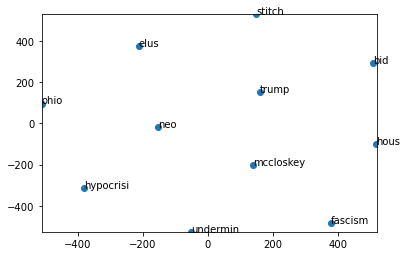

In [72]:
display_closestwords_tsnescatterplot(WD, 'trump')


***
## <span style="color: #b25111"> K-Means : the method of cosine_distance </span>

***Cosine similarity is a metric used to measure how similar documents are irrespective of their size. Mathematically, it measures the cosine of the angle between two vectors projected in a multi-dimensional space. This would involve creating word vectors for the set of words and all the tweets then performing the cosine similarity.*** 
<br>***TFIDF (bag of words model) Vectorizer would be ideal for the vectorization.***

***je l'ai appliqué dans la colonne processing_Tweet***

## <span style="color:red"> nbr_cluster =3

In [52]:


from nltk.cluster import KMeansClusterer
import nltk
X = WD[WD.wv.vocab]
NUM_CLUSTERS=3
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=25)
assigned_clusters = kclusterer.cluster(X, assign_clusters=True)
print (assigned_clusters)

<ipython-input-52-62f2aa1eff1b>:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  X = WD[WD.wv.vocab]


[2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

In [53]:
words = list(WD.wv.vocab)
for i, word in enumerate(words):  
    print (word + ":" + str(assigned_clusters))

ericrweinstein:[2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




ideolog:[2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1950:[2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



300:[2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [54]:
from sklearn import cluster
from sklearn import metrics

kmeans = cluster.KMeans(n_clusters=NUM_CLUSTERS)
kmeans.fit(X)
 
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
 
print ("Cluster id labels for inputted data")
print (labels)
print ("Centroids data")
print (centroids)
 
print ("Score (Opposite of the value of X on the K-means ----> is Sum of distances of samples to their closest cluster center):")
print (kmeans.score(X))
 


Cluster id labels for inputted data
[2 1 0 ... 2 2 2]
Centroids data
[[ 0.25645405  0.0841125  -0.2256111   0.00711182 -0.01299056 -0.35287112
   0.2631588   0.09383874  0.08449201 -0.07367369  0.00167206 -0.16687079
   0.02996606 -0.06170397 -0.09242609  0.01035846 -0.00934207  0.06102708
  -0.08445265 -0.05298293  0.13599768  0.21601138  0.06057191 -0.18515435
   0.07658476 -0.0402834  -0.05782063  0.02946678 -0.00512887 -0.24129882
   0.272438    0.23616272 -0.25770235 -0.0491116  -0.11123141  0.20947313
   0.08161633  0.21743453 -0.08742335 -0.13144058  0.21299934 -0.23091528
  -0.12333474  0.27437758  0.41834727 -0.12386288  0.26607347 -0.004821
  -0.16392665  0.1647252  -0.13118775  0.08046472 -0.13868837 -0.25813943
   0.10537823  0.07123274  0.17288284 -0.10593244  0.2743553  -0.0327326
  -0.11513498 -0.22957754  0.06178726  0.18699655  0.16177638 -0.09842573
  -0.18793336  0.0448129  -0.1858839  -0.19772318 -0.0738766  -0.00298951
   0.11755943 -0.03413331  0.04279416 -0.02740

KeyError: 0

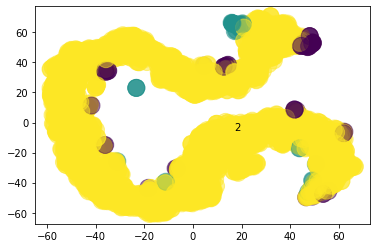

In [55]:
import matplotlib.pyplot as plt
 
from sklearn.manifold import TSNE

model = TSNE(n_components=2, random_state=0)
np.set_printoptions(suppress=True) 
Y=model.fit_transform(X)
plt.scatter(Y[:, 0], Y[:, 1], c=assigned_clusters, s=290,alpha=.5)
for j in range(len(data_sample)):    
    
    plt.annotate(assigned_clusters[j],xy=(Y[j][0], Y[j][1]),xytext=(0,0),textcoords='offset points')
    print("%s %s" % (assigned_clusters[j],  data_sample[j]))
plt.show()

***

In [41]:
#Visualization through PCA (principal component analysis)¶


D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 49828 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 53580 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 51060 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 50472 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 49828 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\anaconda\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 53580 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\anaconda\lib\site-packages\ma

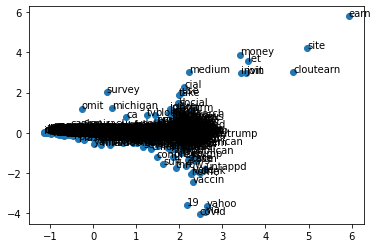

In [56]:
from sklearn.decomposition import PCA
from matplotlib import pyplot
# fit a 2d PCA model to the vectors

pca = PCA(n_components=2)
result = pca.fit_transform(X)

# create a scatter plot of the projection
pyplot.scatter(result[:, 0], result[:, 1])
words = list(WD.wv.vocab)

for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]))
pyplot.show()

***
## <span style="color: #b25111"> K-Means : the method of MiniBatchKMeans </span>

***Mini Batch K-means algorithm‘s main idea is to use small random batches of data of a fixed size, so they can be stored in memory.***
<br>***Each iteration a new random sample from the dataset is obtained and used to update the clusters and this is repeated until convergence.***

***je l'ai appliqué dans la colonne cleaning_Tweet***

## <span style="color: red"> K-means = 30

In [58]:

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import KMeans

from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [59]:
tfidf = TfidfVectorizer(
    min_df = 5,
    max_df = 0.95,
    max_features = 100,
    stop_words = 'english'
)
tf = tfidf.fit_transform(data_sample)


Fit 1 clusters
Fit 2 clusters
Fit 3 clusters
Fit 4 clusters
Fit 5 clusters
Fit 6 clusters
Fit 7 clusters
Fit 8 clusters
Fit 9 clusters
Fit 10 clusters
Fit 11 clusters
Fit 12 clusters
Fit 13 clusters
Fit 14 clusters
Fit 15 clusters
Fit 16 clusters
Fit 17 clusters
Fit 18 clusters
Fit 19 clusters
Fit 20 clusters


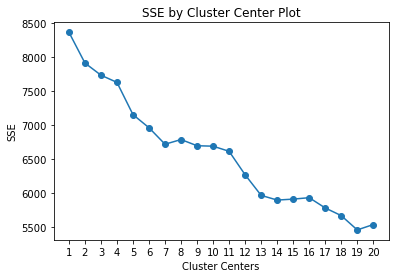

In [74]:
def find_optimal_clusters(data_sample, max_k):
    iters = range(1, max_k+1, 1)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=5).fit(data_sample).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')
    
find_optimal_clusters(tf, 20)

## nbr_cluster =30

In [75]:
clusters = MiniBatchKMeans(n_clusters=3, init_size=1024, batch_size=2048, random_state=10000).fit_predict(tf)

In [67]:
# Plotting Clusters

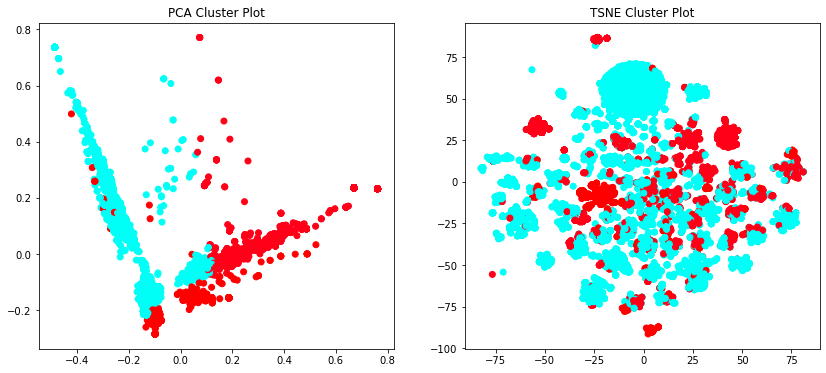

In [76]:
def plot_tsne_pca(data_sample, labels):
    max_label = max(labels)
    max_items = np.random.choice(range(data_sample.shape[0]), size=10000, replace=False)
    
    pca = PCA(n_components=3).fit_transform(data_sample[max_items,:].todense())
    tsne = TSNE().fit_transform(PCA(n_components=50).fit_transform(data_sample[max_items,:].todense()))
    
    
    idx = np.random.choice(range(pca.shape[0]), size=10000, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
plot_tsne_pca(tf, clusters)

In [64]:
# Top Keywords

In [77]:
def get_top_keywords(data_sample, clusters, labels, n_terms):
    df = pd.DataFrame(data_sample.todense()).groupby(clusters).mean()
    
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(tf, clusters, tfidf.get_feature_names(), 30)


Cluster 0
year,al,health,use,day,need,team,join,cial,trump,know,life,pandemic,work,2020,distance,time,stop,face,like,people,new,news,amp,marketing,security,justice,distancing,media,social

Cluster 1
pandemic,say,help,trump,yahoo,al,cial,right,think,need,work,want,know,time,good,home,year,vaccine,public,19,like,care,new,culture,drinking,covid,people,mental,amp,health

Cluster 2
let,day,al,make,new,cloutearn,earned,lets,earn,need,think,life,money,site,time,twitter,really,join,inviting,ac,justice,know,use,post,amp,like,people,distancing,media,cial


***
## <span style="color: #b25111"> WordCloud </span>

In [ ]:
!pip install WordCloud

In [115]:
WordCloud

wordcloud.wordcloud.WordCloud

## **<center> <span style="color: #b25111"> The world cloud on the Cleaning_TweetColumn***

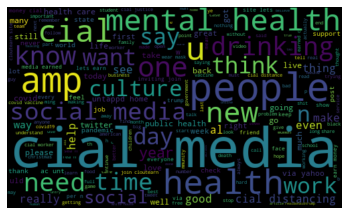

In [78]:
from wordcloud import WordCloud 

allWords = ' '.join([term for term in data_sample] )
wordCloud = WordCloud(width =500, height=300, random_state=21, max_font_size = 119).generate(allWords)

plt.imshow(wordCloud, interpolation = "bilinear")
plt.axis('off')
plt.show()

In [14]:
pip list

Package                            VersionNote: you may need to restart the kernel to use updated packages.

---------------------------------- -------------------
absl-py                            0.11.0
alabaster                          0.7.12
altair                             4.1.0
anaconda-client                    1.7.2
anaconda-navigator                 1.9.12
anaconda-project                   0.8.3
argh                               0.26.2
asn1crypto                         1.3.0
astroid                            2.4.2
astropy                            4.0.1.post1
astunparse                         1.6.3
atomicwrites                       1.4.0
attrs                              19.3.0
autopep8                           1.5.3
Babel                              2.8.0
backcall                           0.2.0
backports.functools-lru-cache      1.6.1
backports.shutil-get-terminal-size 1.0.0
backports.tempfile                 1.0
backports.weakref                  1.0.post1
bcr

***

# <span style="color:yellow"> Conclusion

***As a conclusion, I found that the cosine similarity is good for cases where duplication matters***    
<br>***Mini batch k-means has the main advantage of reducing of computational cost of finding a partition.***
<br>***This cost is proportional to the size of the sample batch used and this difference is more evident when the number of clusters is larger.***
    
<br>***I tryed to work with the Jaccard Similarity methode because is good for cases where duplication does not matter (the context matters) but performance problem occured***
